In [ ]:
# TÍTULO: Inferencia y Generación de Recortes (ROI)
# OBJETIVO: Validar el modelo de autos y generar los inputs para el detector de placas.

from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt
import glob
from tqdm.notebook import tqdm

# --- CONFIGURACIÓN ---
# MODEL_PATH = '../../production_weights/01_autos_best.pt' 

PROJECT_DIR = '../../models/01_autos'
run_name = f"01_v8n_baseline_dataset_tl"
model_yolov8n_baseline_tl = os.path.join(PROJECT_DIR, run_name, 'weights', 'best.pt')
model = YOLO(model_yolov8n_baseline_tl)


# Imágenes de prueba (pueden ser las del test set o nuevas descargadas de internet)
TEST_IMAGES_DIR = '../../datasets/01_autos/test/images'
OUTPUT_DIR = '../../data/processed/01_autos_recortes_test'

# Cargar Modelo
# model = YOLO(MODEL_PATH)


# Crear carpeta de salida
os.makedirs(OUTPUT_DIR, exist_ok=True)

def extract_crops(source_dir, output_dir):
    image_paths = glob.glob(os.path.join(source_dir, '*.jpg'))
    print(f"Procesando {len(image_paths)} imágenes...")
    
    count = 0
    for img_path in tqdm(image_paths):
        # Inferencia
        # conf=0.5: Solo autos con alta confianza
        results = model.predict(img_path, conf=0.5, verbose=False)
        
        original_img = cv2.imread(img_path)
        if original_img is None: continue
        
        for r in results:
            boxes = r.boxes
            for i, box in enumerate(boxes):
                # Coordenadas
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                
                # RECORTE (La magia del pipeline)
                # Validar límites para no romper cv2
                h, w, _ = original_img.shape
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w, x2), min(h, y2)
                
                crop = original_img[y1:y2, x1:x2]
                
                # Guardar recorte si tiene un tamaño decente
                if crop.size > 0 and crop.shape[0] > 10 and crop.shape[1] > 10:
                    base_name = os.path.splitext(os.path.basename(img_path))[0]
                    save_name = f"{base_name}_crop_{i}.jpg"
                    cv2.imwrite(os.path.join(output_dir, save_name), crop)
                    count += 1

    print(f"Se generaron {count} recortes de autos en '{output_dir}'")

# Ejecutar
extract_crops(TEST_IMAGES_DIR, OUTPUT_DIR)

Procesando 1615 imágenes...


  0%|          | 0/1615 [00:00<?, ?it/s]

Se generaron 1626 recortes de autos en '../../data/processed/car_crops_test'


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Velocidad de Inferencia: 158.75 FPS
Latencia por imagen: 6.30 ms


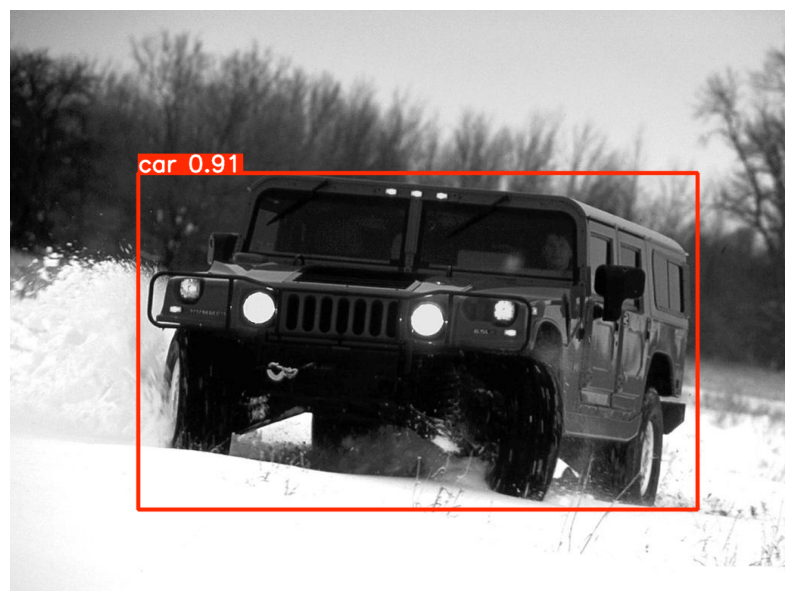

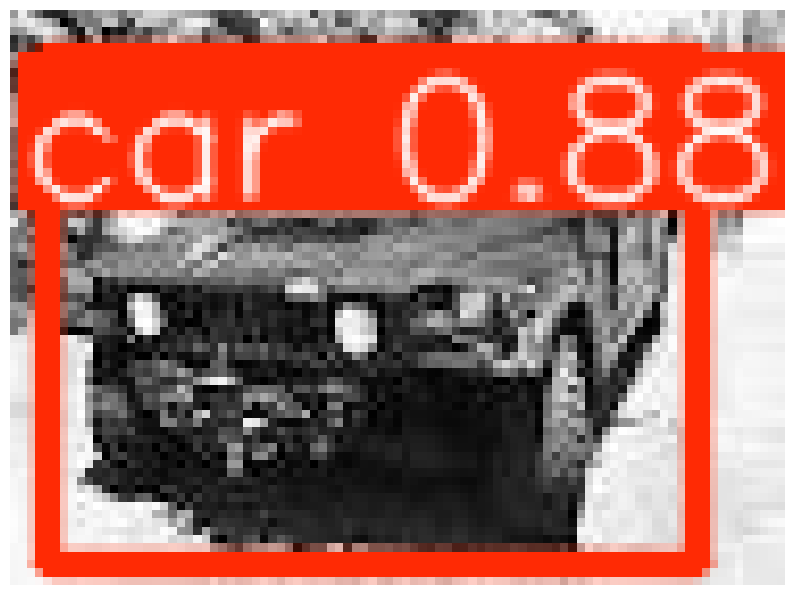

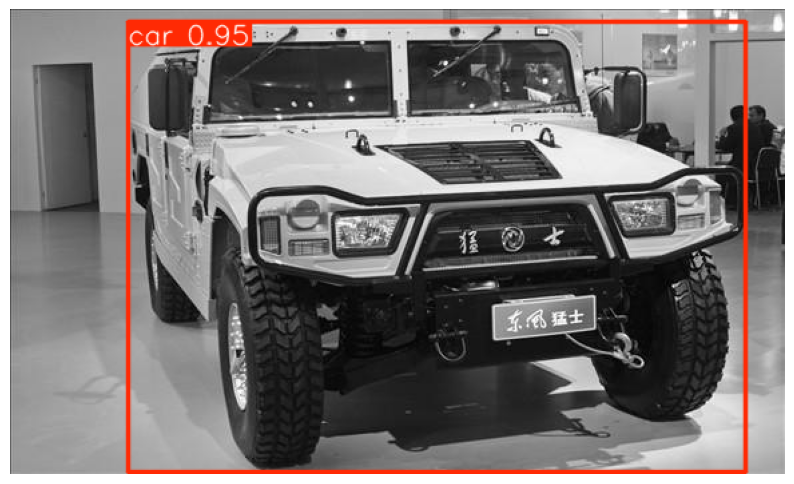

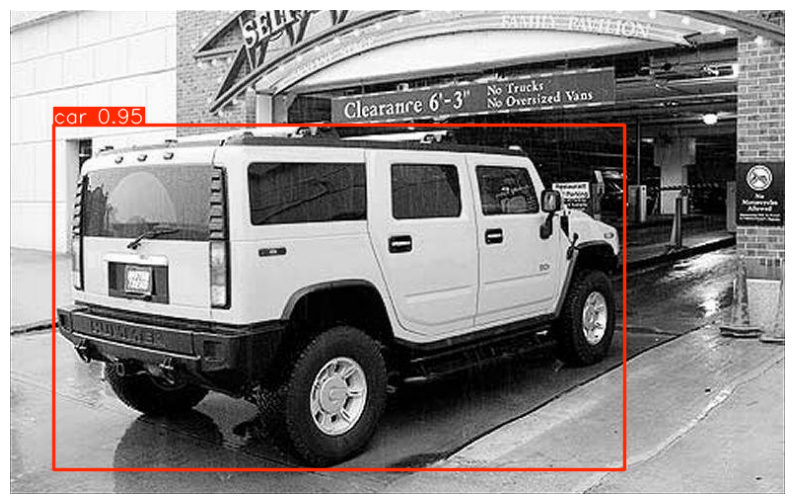

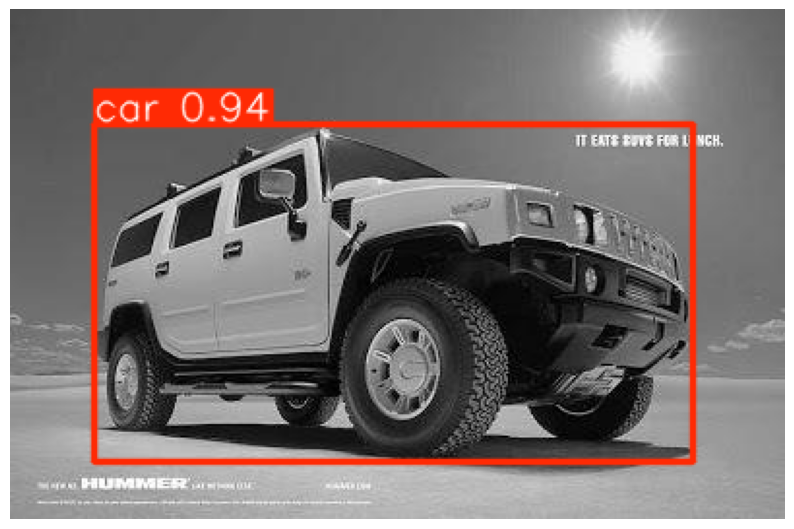

In [5]:
import time

# Mide velocidad pura
start = time.time()
results = model.predict(TEST_IMAGES_DIR, device=0, verbose=False)
end = time.time()

total_time = end - start
fps = len(results) / total_time

print(f"Velocidad de Inferencia: {fps:.2f} FPS")
print(f"Latencia por imagen: {(total_time/len(results))*1000:.2f} ms")

# Visualización de algunos resultados
for r in results[5:10]:  # Muestra las imágenes de la 6 a la 10
    plt.figure(figsize=(10, 10))
    plt.imshow(r.plot())
    plt.axis('off')
    plt.show()

In [ ]:
# TÍTULO: Inferencia y Generación de Recortes (ROI)
# OBJETIVO: Validar el modelo de autos y generar los inputs para el detector de placas.

from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt
import glob
from tqdm.notebook import tqdm

# --- CONFIGURACIÓN ---
# MODEL_PATH = '../../production_weights/01_autos_best.pt' 

PROJECT_DIR = '../../models/01_autos'
run_name = f"02_v8n_baseline_dataset_no_tl"
model_yolov8n_baseline_tl = os.path.join(PROJECT_DIR, run_name, 'weights', 'best.pt')
model = YOLO(model_yolov8n_baseline_tl)


# Imágenes de prueba (pueden ser las del test set o nuevas descargadas de internet)
TEST_IMAGES_DIR = '../../datasets/01_autos/test/images'
OUTPUT_DIR = '../../data/processed/01_autos_recortes_test'

# Cargar Modelo
# model = YOLO(MODEL_PATH)


# Crear carpeta de salida
os.makedirs(OUTPUT_DIR, exist_ok=True)

def extract_crops(source_dir, output_dir):
    image_paths = glob.glob(os.path.join(source_dir, '*.jpg'))
    print(f"Procesando {len(image_paths)} imágenes...")
    
    count = 0
    for img_path in tqdm(image_paths):
        # Inferencia
        # conf=0.5: Solo autos con alta confianza
        results = model.predict(img_path, conf=0.5, verbose=False)
        
        original_img = cv2.imread(img_path)
        if original_img is None: continue
        
        for r in results:
            boxes = r.boxes
            for i, box in enumerate(boxes):
                # Coordenadas
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                
                # RECORTE (La magia del pipeline)
                # Validar límites para no romper cv2
                h, w, _ = original_img.shape
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w, x2), min(h, y2)
                
                crop = original_img[y1:y2, x1:x2]
                
                # Guardar recorte si tiene un tamaño decente
                if crop.size > 0 and crop.shape[0] > 10 and crop.shape[1] > 10:
                    base_name = os.path.splitext(os.path.basename(img_path))[0]
                    save_name = f"{base_name}_crop_{i}.jpg"
                    cv2.imwrite(os.path.join(output_dir, save_name), crop)
                    count += 1

    print(f"Se generaron {count} recortes de autos en '{output_dir}'")

# Ejecutar
extract_crops(TEST_IMAGES_DIR, OUTPUT_DIR)

Procesando 1615 imágenes...


  0%|          | 0/1615 [00:00<?, ?it/s]

Se generaron 1631 recortes de autos en '../../data/processed/01_autos_recortes_test'


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Velocidad de Inferencia: 158.17 FPS
Latencia por imagen: 6.32 ms


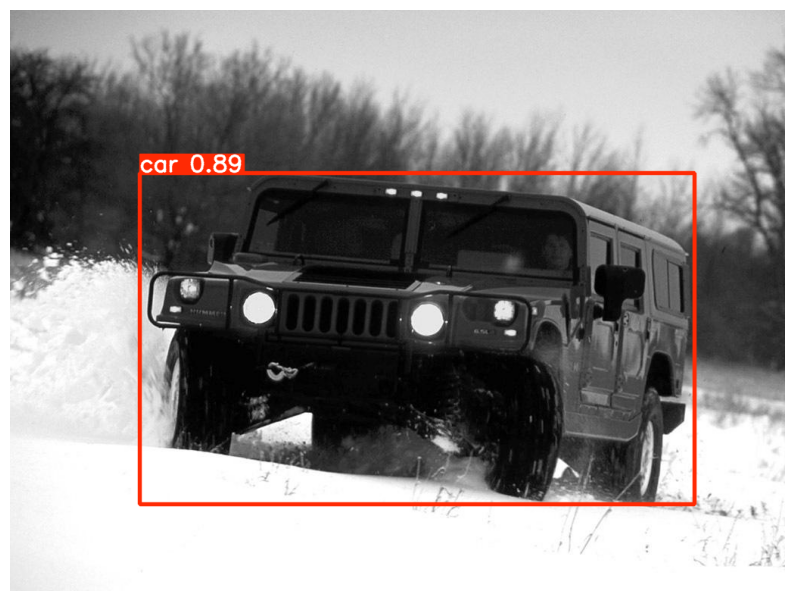

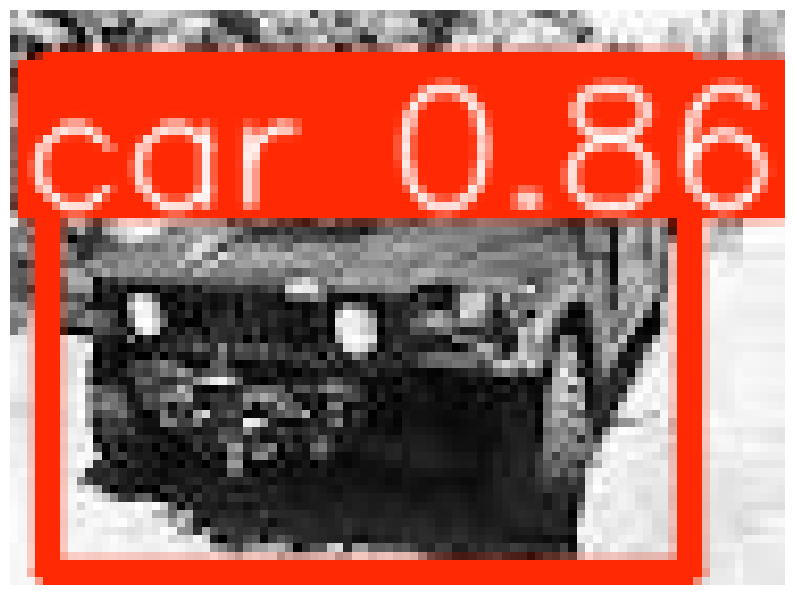

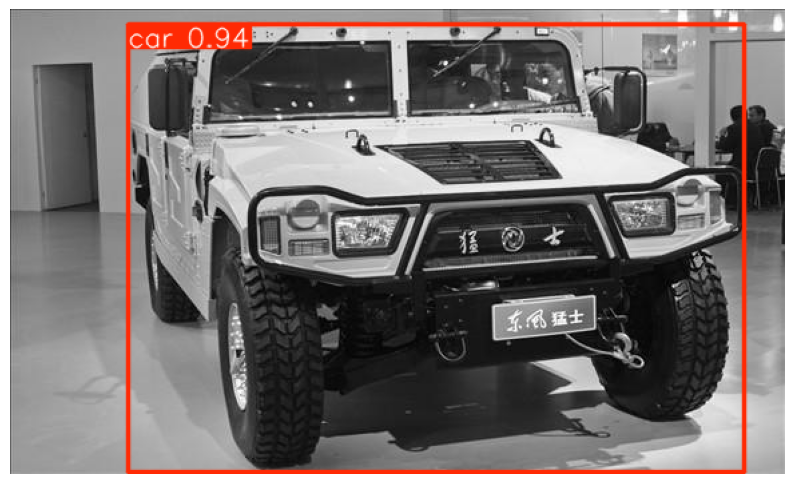

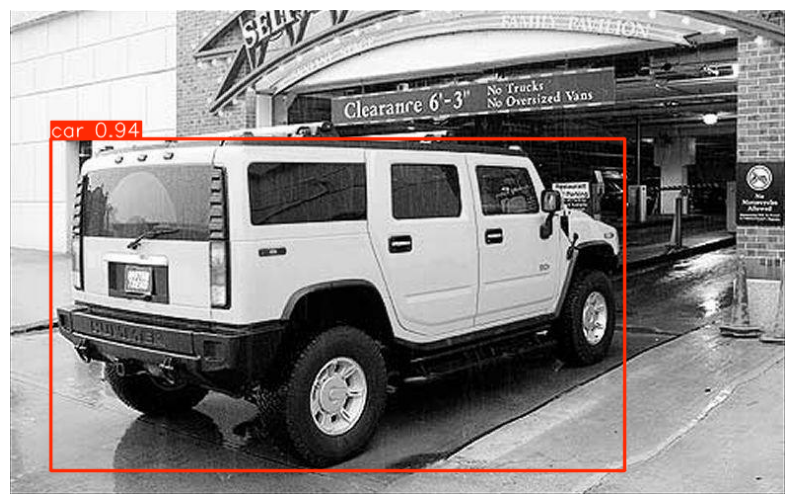

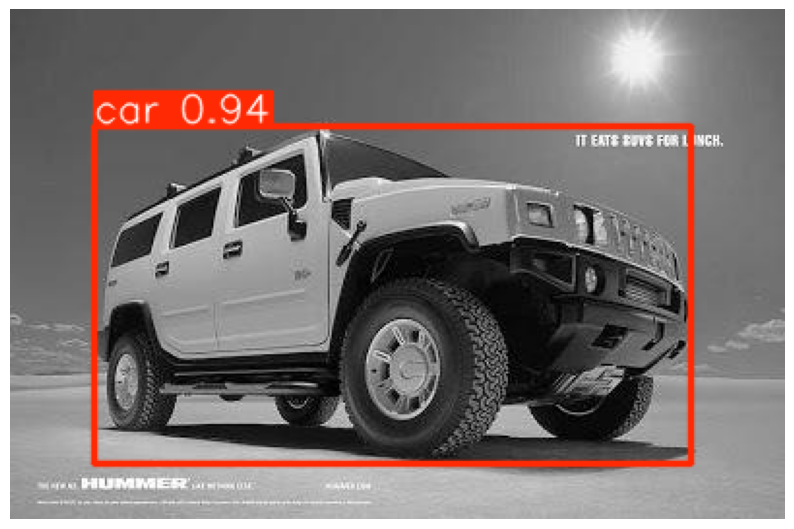

In [7]:
import time

# Mide velocidad pura
start = time.time()
results = model.predict(TEST_IMAGES_DIR, device=0, verbose=False)
end = time.time()

total_time = end - start
fps = len(results) / total_time

print(f"Velocidad de Inferencia: {fps:.2f} FPS")
print(f"Latencia por imagen: {(total_time/len(results))*1000:.2f} ms")

# Visualización de algunos resultados
for r in results[5:10]:  # Muestra las imágenes de la 6 a la 10
    plt.figure(figsize=(10, 10))
    plt.imshow(r.plot())
    plt.axis('off')
    plt.show()

In [ ]:
# TÍTULO: Inferencia y Generación de Recortes (ROI)
# OBJETIVO: Validar el modelo de autos y generar los inputs para el detector de placas.

from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt
import glob
from tqdm.notebook import tqdm

# --- CONFIGURACIÓN ---
# MODEL_PATH = '../../production_weights/01_autos_best.pt' 

PROJECT_DIR = '../../models/01_autos'
run_name = f"03_v8n_resplit_dataset_tl"
model_yolov8n_baseline_tl = os.path.join(PROJECT_DIR, run_name, 'weights', 'best.pt')
model = YOLO(model_yolov8n_baseline_tl)


# Imágenes de prueba (pueden ser las del test set o nuevas descargadas de internet)
TEST_IMAGES_DIR = '../../datasets/01_autos/test/images'
OUTPUT_DIR = '../../data/processed/01_autos_recortes_test'

# Cargar Modelo
# model = YOLO(MODEL_PATH)


# Crear carpeta de salida
os.makedirs(OUTPUT_DIR, exist_ok=True)

def extract_crops(source_dir, output_dir):
    image_paths = glob.glob(os.path.join(source_dir, '*.jpg'))
    print(f"Procesando {len(image_paths)} imágenes...")
    
    count = 0
    for img_path in tqdm(image_paths):
        # Inferencia
        # conf=0.5: Solo autos con alta confianza
        results = model.predict(img_path, conf=0.5, verbose=False)
        
        original_img = cv2.imread(img_path)
        if original_img is None: continue
        
        for r in results:
            boxes = r.boxes
            for i, box in enumerate(boxes):
                # Coordenadas
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                
                # RECORTE
                # Validar límites para no romper cv2
                h, w, _ = original_img.shape
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w, x2), min(h, y2)
                
                crop = original_img[y1:y2, x1:x2]
                
                # Guardar recorte si tiene un tamaño decente
                if crop.size > 0 and crop.shape[0] > 10 and crop.shape[1] > 10:
                    base_name = os.path.splitext(os.path.basename(img_path))[0]
                    save_name = f"{base_name}_crop_{i}.jpg"
                    cv2.imwrite(os.path.join(output_dir, save_name), crop)
                    count += 1

    print(f"Se generaron {count} recortes de autos en '{output_dir}'")

# Ejecutar
extract_crops(TEST_IMAGES_DIR, OUTPUT_DIR)

Procesando 1615 imágenes...


  0%|          | 0/1615 [00:00<?, ?it/s]

Se generaron 1622 recortes de autos en '../../data/processed/01_autos_recortes_test'


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Velocidad de Inferencia: 159.49 FPS
Latencia por imagen: 6.27 ms


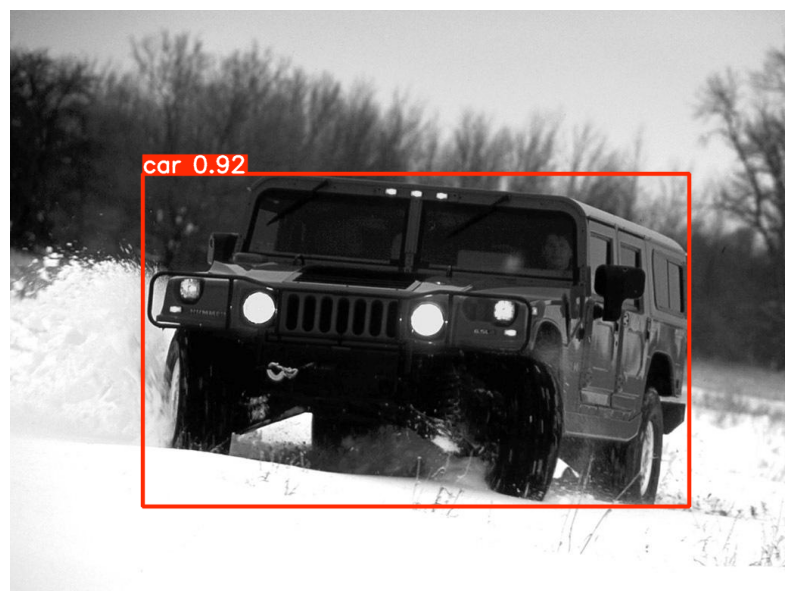

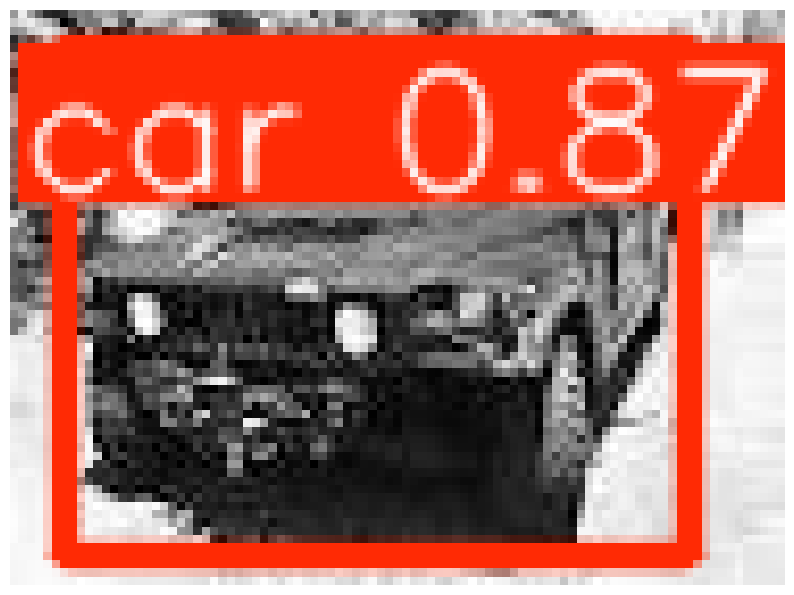

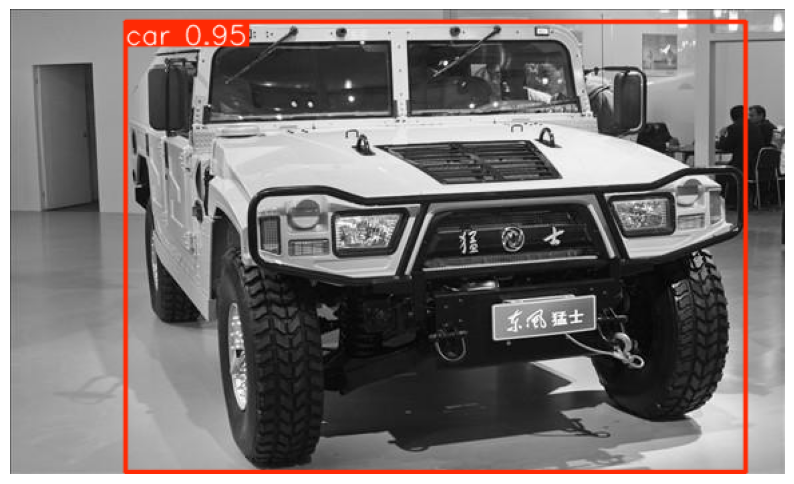

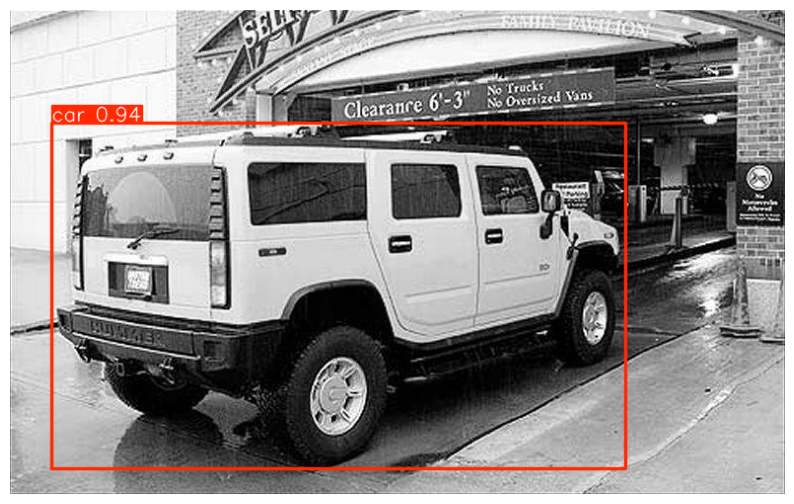

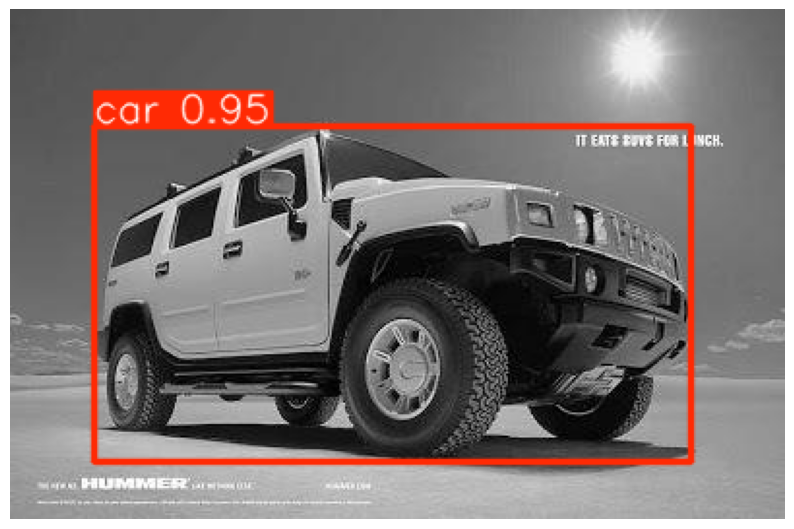

In [10]:
import time

# Mide velocidad pura
start = time.time()
results = model.predict(TEST_IMAGES_DIR, device=0, verbose=False)
end = time.time()

total_time = end - start
fps = len(results) / total_time

print(f"Velocidad de Inferencia: {fps:.2f} FPS")
print(f"Latencia por imagen: {(total_time/len(results))*1000:.2f} ms")

# Visualización de algunos resultados
for r in results[5:10]:  # Muestra las imágenes de la 6 a la 10
    plt.figure(figsize=(10, 10))
    plt.imshow(r.plot())
    plt.axis('off')
    plt.show()

In [ ]:
# TÍTULO: Inferencia y Generación de Recortes (ROI)
# OBJETIVO: Validar el modelo de autos y generar los inputs para el detector de placas.

from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt
import glob
from tqdm.notebook import tqdm

# --- CONFIGURACIÓN ---
# MODEL_PATH = '../../production_weights/01_autos_best.pt' 

PROJECT_DIR = '../../models/01_autos'
run_name = f"04_v8n_resplit_dataset_no_tl"
model_yolov8n_baseline_tl = os.path.join(PROJECT_DIR, run_name, 'weights', 'best.pt')
model = YOLO(model_yolov8n_baseline_tl)


# Imágenes de prueba (pueden ser las del test set o nuevas descargadas de internet)
TEST_IMAGES_DIR = '../../datasets/01_autos/test/images'
OUTPUT_DIR = '../../data/processed/01_autos_recortes_test'

# Cargar Modelo
# model = YOLO(MODEL_PATH)


# Crear carpeta de salida
os.makedirs(OUTPUT_DIR, exist_ok=True)

def extract_crops(source_dir, output_dir):
    image_paths = glob.glob(os.path.join(source_dir, '*.jpg'))
    print(f"Procesando {len(image_paths)} imágenes...")
    
    count = 0
    for img_path in tqdm(image_paths):
        # Inferencia
        # conf=0.5: Solo autos con alta confianza
        results = model.predict(img_path, conf=0.5, verbose=False)
        
        original_img = cv2.imread(img_path)
        if original_img is None: continue
        
        for r in results:
            boxes = r.boxes
            for i, box in enumerate(boxes):
                # Coordenadas
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                
                # RECORTE (La magia del pipeline)
                # Validar límites para no romper cv2
                h, w, _ = original_img.shape
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w, x2), min(h, y2)
                
                crop = original_img[y1:y2, x1:x2]
                
                # Guardar recorte si tiene un tamaño decente
                if crop.size > 0 and crop.shape[0] > 10 and crop.shape[1] > 10:
                    base_name = os.path.splitext(os.path.basename(img_path))[0]
                    save_name = f"{base_name}_crop_{i}.jpg"
                    cv2.imwrite(os.path.join(output_dir, save_name), crop)
                    count += 1

    print(f"Se generaron {count} recortes de autos en '{output_dir}'")

# Ejecutar
extract_crops(TEST_IMAGES_DIR, OUTPUT_DIR)

Procesando 1615 imágenes...


  0%|          | 0/1615 [00:00<?, ?it/s]

Se generaron 1637 recortes de autos en '../../data/processed/01_autos_recortes_test'


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Velocidad de Inferencia: 157.88 FPS
Latencia por imagen: 6.33 ms


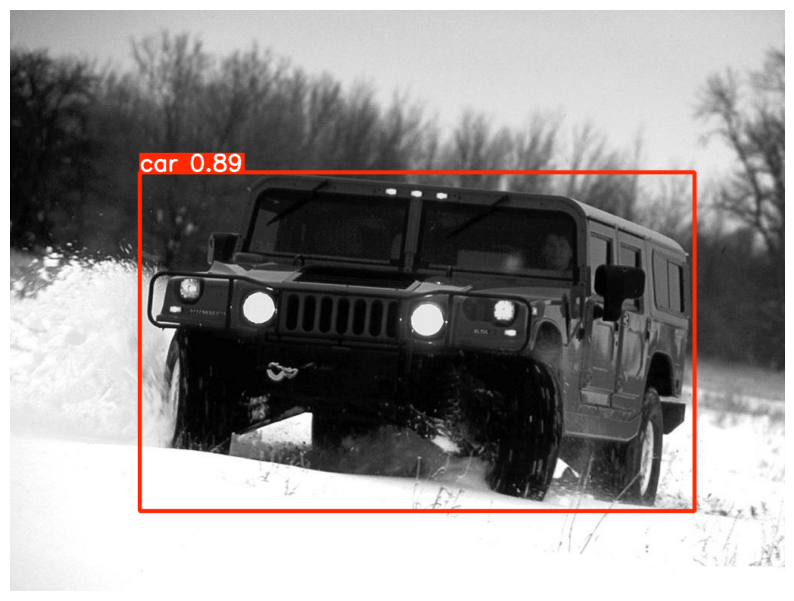

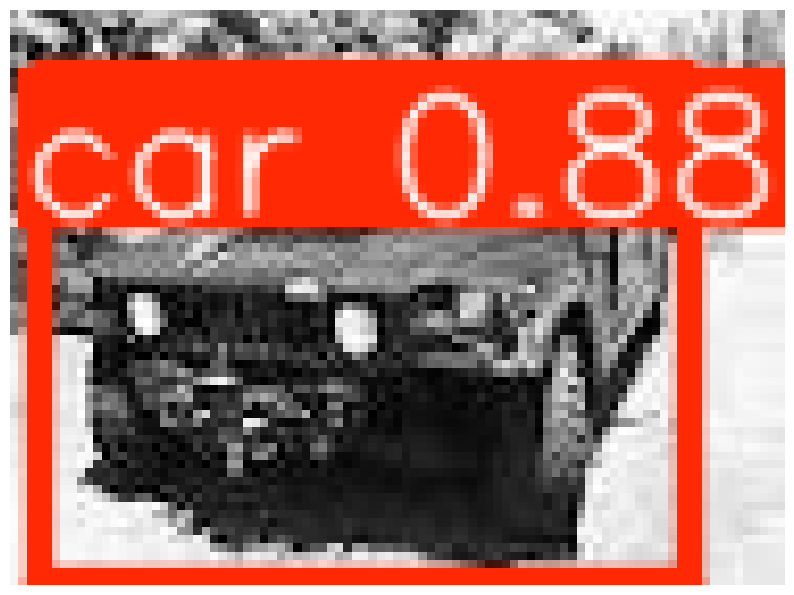

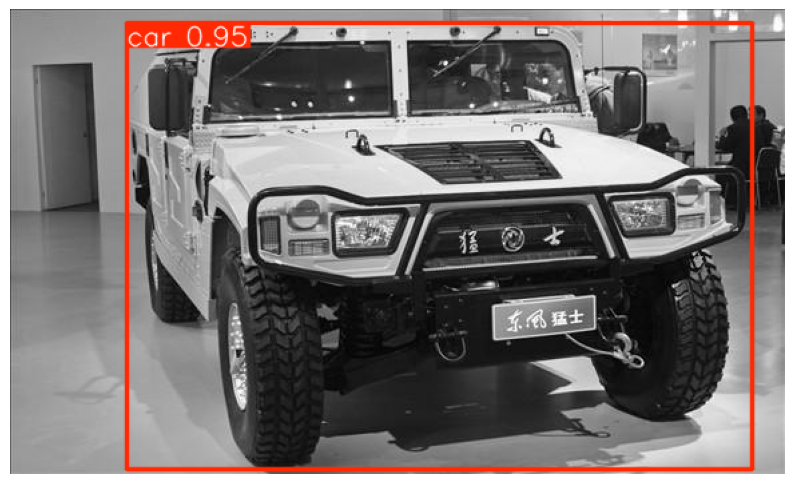

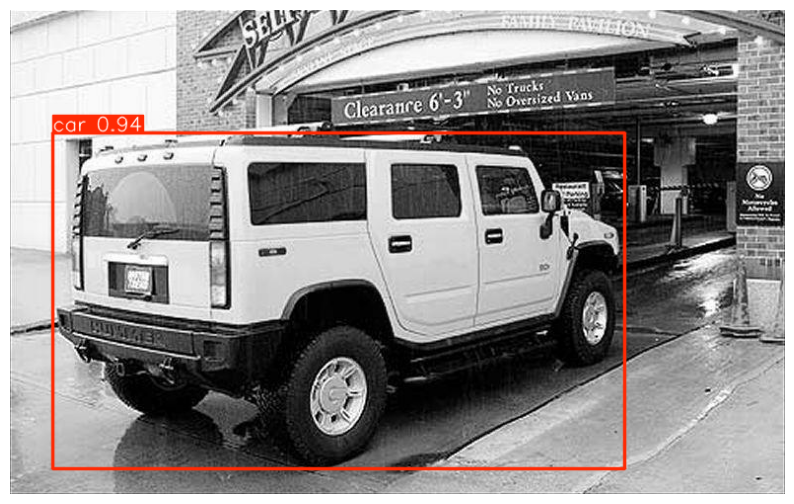

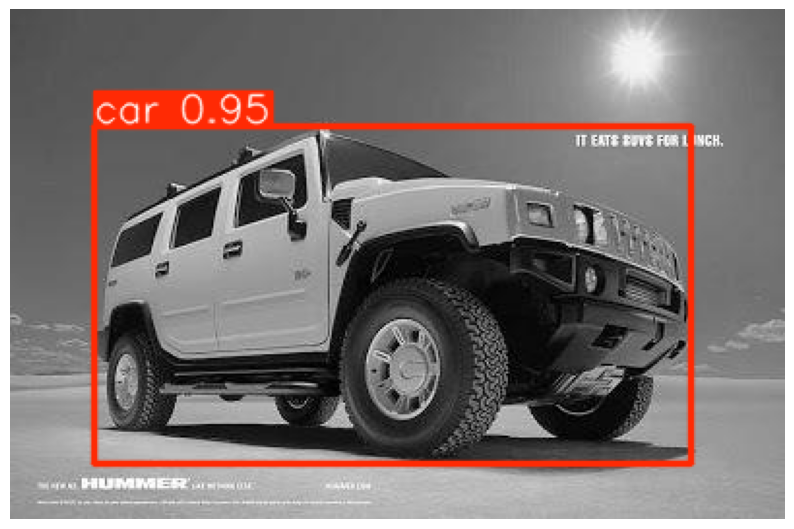

In [13]:
import time

# Mide velocidad pura
start = time.time()
results = model.predict(TEST_IMAGES_DIR, device=0, verbose=False)
end = time.time()

total_time = end - start
fps = len(results) / total_time

print(f"Velocidad de Inferencia: {fps:.2f} FPS")
print(f"Latencia por imagen: {(total_time/len(results))*1000:.2f} ms")

# Visualización de algunos resultados
for r in results[5:10]:  # Muestra las imágenes de la 6 a la 10
    plt.figure(figsize=(10, 10))
    plt.imshow(r.plot())
    plt.axis('off')
    plt.show()

In [14]:
# TÍTULO: Inferencia y Generación de Recortes (ROI)
# OBJETIVO: Validar el modelo de autos y generar los inputs para el detector de placas.

from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt
import glob
from tqdm.notebook import tqdm

# --- CONFIGURACIÓN ---
# MODEL_PATH = '../../production_weights/01_autos_best.pt' 

PROJECT_DIR = '../../models/01_autos'
run_name = f"05_v11n_resplit_dataset_tl"
model_yolov8n_baseline_tl = os.path.join(PROJECT_DIR, run_name, 'weights', 'best.pt')
model = YOLO(model_yolov8n_baseline_tl)


# Imágenes de prueba (pueden ser las del test set o nuevas descargadas de internet)
TEST_IMAGES_DIR = '../../datasets/01_autos/test/images'
OUTPUT_DIR = '../../data/processed/01_autos_recortes_test'

# Cargar Modelo
# model = YOLO(MODEL_PATH)


# Crear carpeta de salida
os.makedirs(OUTPUT_DIR, exist_ok=True)

def extract_crops(source_dir, output_dir):
    image_paths = glob.glob(os.path.join(source_dir, '*.jpg'))
    print(f"Procesando {len(image_paths)} imágenes...")
    
    count = 0
    for img_path in tqdm(image_paths):
        # Inferencia
        # conf=0.5: Solo autos con alta confianza
        results = model.predict(img_path, conf=0.5, verbose=False)
        
        original_img = cv2.imread(img_path)
        if original_img is None: continue
        
        for r in results:
            boxes = r.boxes
            for i, box in enumerate(boxes):
                # Coordenadas
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                
                # RECORTE (La magia del pipeline)
                # Validar límites para no romper cv2
                h, w, _ = original_img.shape
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w, x2), min(h, y2)
                
                crop = original_img[y1:y2, x1:x2]
                
                # Guardar recorte si tiene un tamaño decente
                if crop.size > 0 and crop.shape[0] > 10 and crop.shape[1] > 10:
                    base_name = os.path.splitext(os.path.basename(img_path))[0]
                    save_name = f"{base_name}_crop_{i}.jpg"
                    cv2.imwrite(os.path.join(output_dir, save_name), crop)
                    count += 1

    print(f"Se generaron {count} recortes de autos en '{output_dir}'")

# Ejecutar
extract_crops(TEST_IMAGES_DIR, OUTPUT_DIR)

Procesando 1615 imágenes...


  0%|          | 0/1615 [00:00<?, ?it/s]

Se generaron 1624 recortes de autos en '../../data/processed/01_autos_recortes_test'


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Velocidad de Inferencia: 133.50 FPS
Latencia por imagen: 7.49 ms


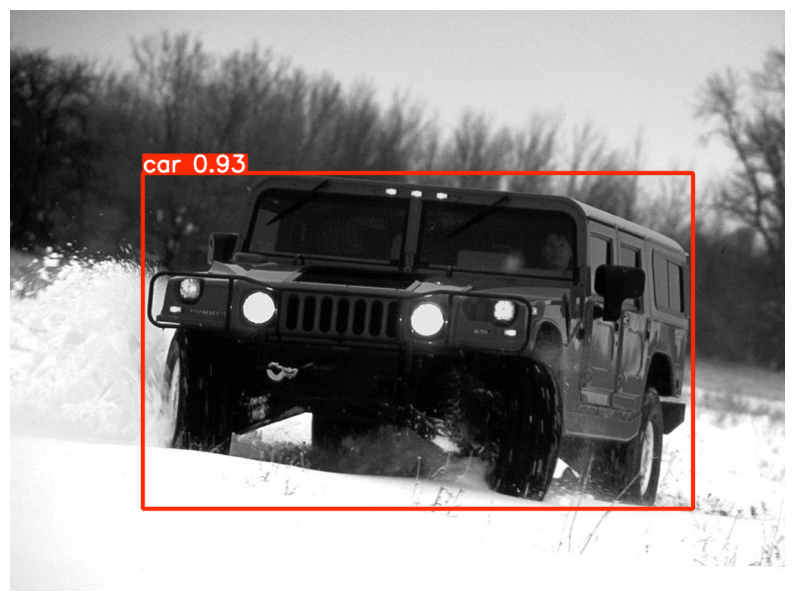

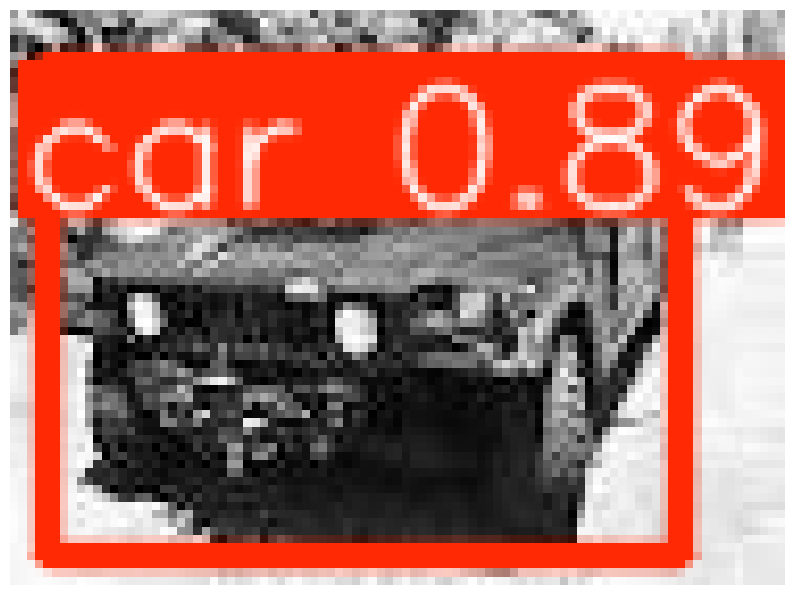

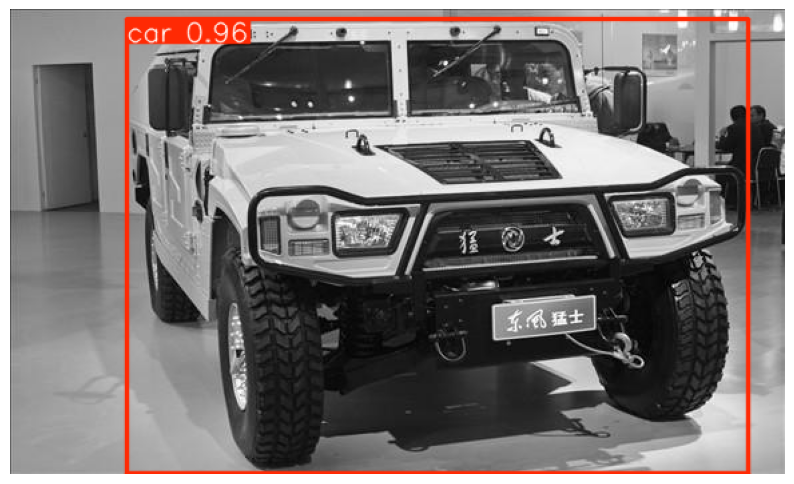

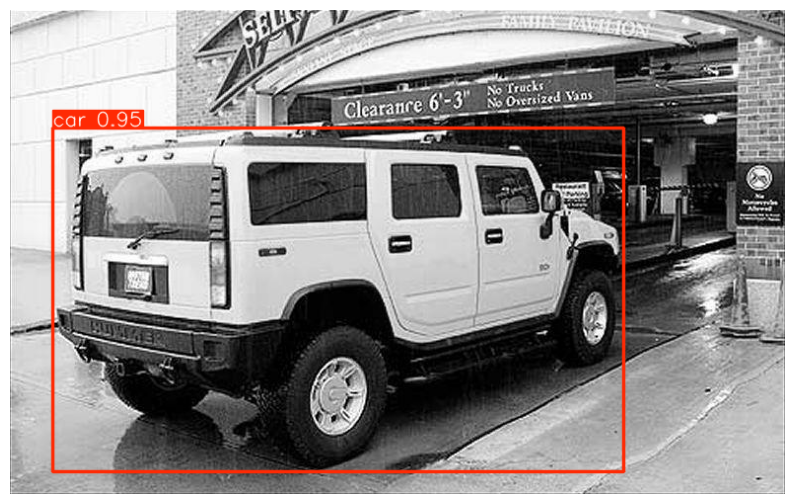

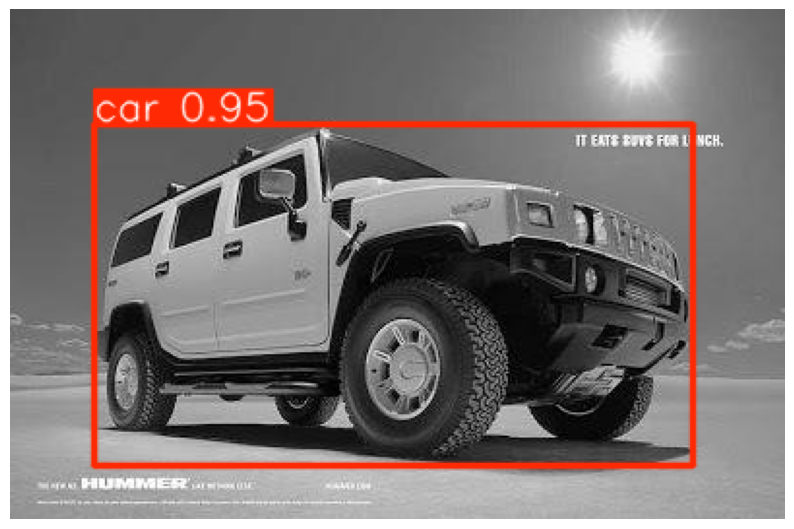

In [15]:
import time

# Mide velocidad pura
start = time.time()
results = model.predict(TEST_IMAGES_DIR, device=0, verbose=False)
end = time.time()

total_time = end - start
fps = len(results) / total_time

print(f"Velocidad de Inferencia: {fps:.2f} FPS")
print(f"Latencia por imagen: {(total_time/len(results))*1000:.2f} ms")

# Visualización de algunos resultados
for r in results[5:10]:  # Muestra las imágenes de la 6 a la 10
    plt.figure(figsize=(10, 10))
    plt.imshow(r.plot())
    plt.axis('off')
    plt.show()

In [16]:
# TÍTULO: Inferencia y Generación de Recortes (ROI)
# OBJETIVO: Validar el modelo de autos y generar los inputs para el detector de placas.

from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt
import glob
from tqdm.notebook import tqdm

# --- CONFIGURACIÓN ---
# MODEL_PATH = '../../production_weights/01_autos_best.pt' 

PROJECT_DIR = '../../models/01_autos'
run_name = f"06_v11n_resplit_dataset_no_tl"
model_yolov8n_baseline_tl = os.path.join(PROJECT_DIR, run_name, 'weights', 'best.pt')
model = YOLO(model_yolov8n_baseline_tl)


# Imágenes de prueba (pueden ser las del test set o nuevas descargadas de internet)
TEST_IMAGES_DIR = '../../datasets/01_autos/test/images'
OUTPUT_DIR = '../../data/processed/01_autos_recortes_test'

# Cargar Modelo
# model = YOLO(MODEL_PATH)


# Crear carpeta de salida
os.makedirs(OUTPUT_DIR, exist_ok=True)

def extract_crops(source_dir, output_dir):
    image_paths = glob.glob(os.path.join(source_dir, '*.jpg'))
    print(f"Procesando {len(image_paths)} imágenes...")
    
    count = 0
    for img_path in tqdm(image_paths):
        # Inferencia
        # conf=0.5: Solo autos con alta confianza
        results = model.predict(img_path, conf=0.5, verbose=False)
        
        original_img = cv2.imread(img_path)
        if original_img is None: continue
        
        for r in results:
            boxes = r.boxes
            for i, box in enumerate(boxes):
                # Coordenadas
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                
                # RECORTE (La magia del pipeline)
                # Validar límites para no romper cv2
                h, w, _ = original_img.shape
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w, x2), min(h, y2)
                
                crop = original_img[y1:y2, x1:x2]
                
                # Guardar recorte si tiene un tamaño decente
                if crop.size > 0 and crop.shape[0] > 10 and crop.shape[1] > 10:
                    base_name = os.path.splitext(os.path.basename(img_path))[0]
                    save_name = f"{base_name}_crop_{i}.jpg"
                    cv2.imwrite(os.path.join(output_dir, save_name), crop)
                    count += 1

    print(f"Se generaron {count} recortes de autos en '{output_dir}'")

# Ejecutar
extract_crops(TEST_IMAGES_DIR, OUTPUT_DIR)

Procesando 1615 imágenes...


  0%|          | 0/1615 [00:00<?, ?it/s]

Se generaron 1634 recortes de autos en '../../data/processed/01_autos_recortes_test'


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Velocidad de Inferencia: 129.24 FPS
Latencia por imagen: 7.74 ms


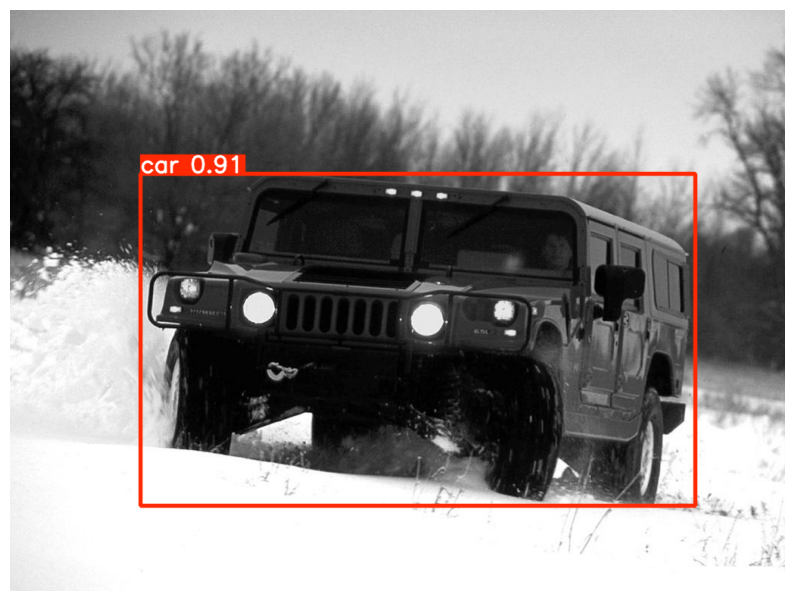

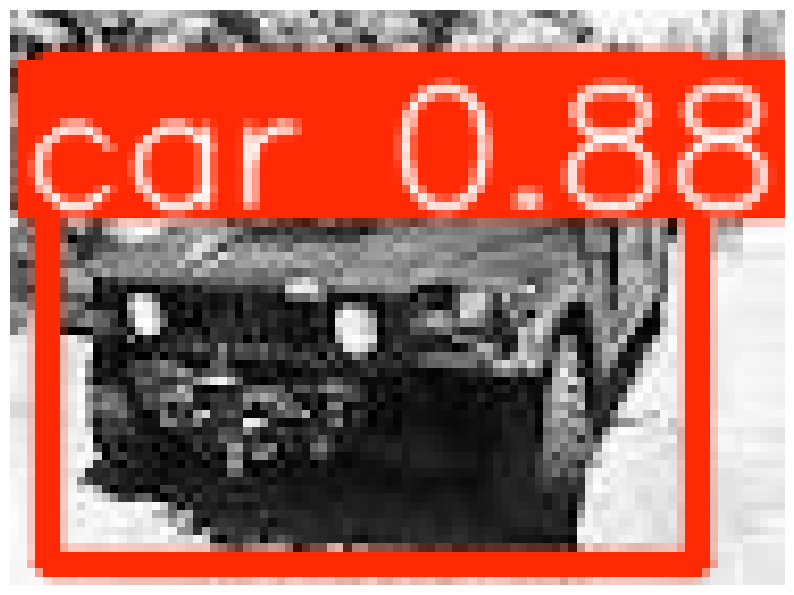

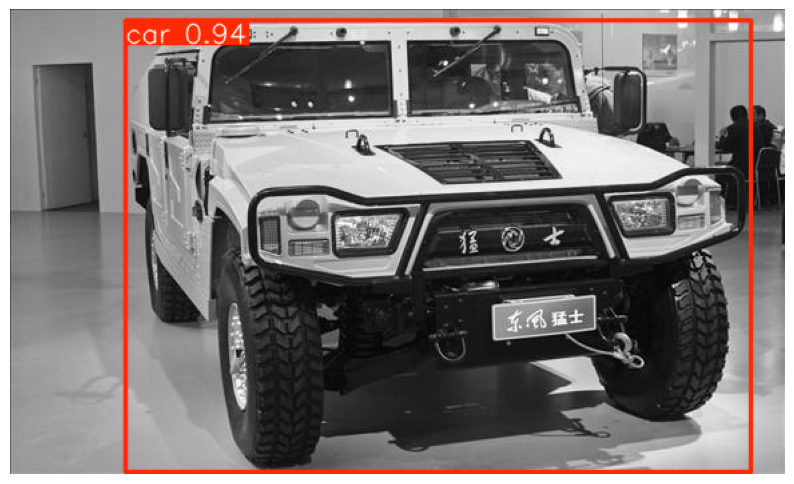

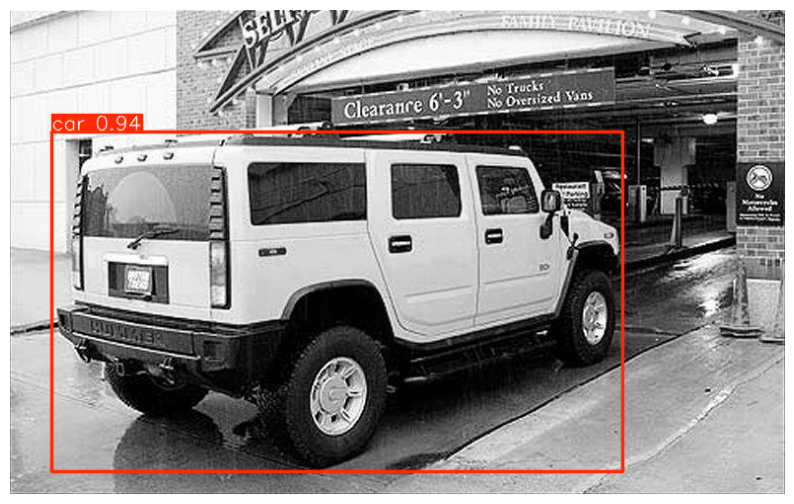

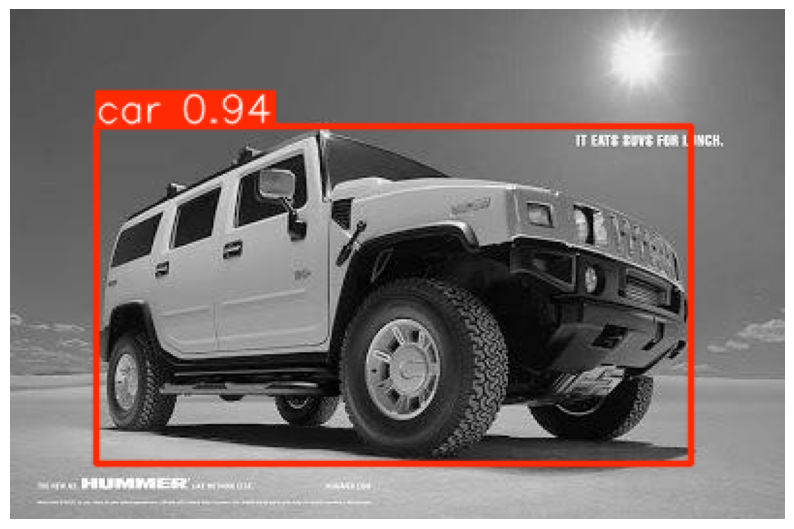

In [17]:
import time

# Mide velocidad pura
start = time.time()
results = model.predict(TEST_IMAGES_DIR, device=0, verbose=False)
end = time.time()

total_time = end - start
fps = len(results) / total_time

print(f"Velocidad de Inferencia: {fps:.2f} FPS")
print(f"Latencia por imagen: {(total_time/len(results))*1000:.2f} ms")

# Visualización de algunos resultados
for r in results[5:10]:  # Muestra las imágenes de la 6 a la 10
    plt.figure(figsize=(10, 10))
    plt.imshow(r.plot())
    plt.axis('off')
    plt.show()

In [20]:
# TÍTULO: Inferencia y Generación de Recortes (ROI)
# OBJETIVO: Validar el modelo de autos y generar los inputs para el detector de placas.

from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt
import glob
from tqdm.notebook import tqdm

# --- CONFIGURACIÓN ---
# MODEL_PATH = '../../production_weights/01_autos_best.pt' 

PROJECT_DIR = '../../models/01_autos'
run_name = f"07_v8s_resplit_dataset_tl"
model_yolov8n_baseline_tl = os.path.join(PROJECT_DIR, run_name, 'weights', 'best.pt')
model = YOLO(model_yolov8n_baseline_tl)


# Imágenes de prueba (pueden ser las del test set o nuevas descargadas de internet)
TEST_IMAGES_DIR = '../../datasets/01_autos/test/images'
OUTPUT_DIR = '../../data/processed/01_autos_recortes_test'

# Cargar Modelo
# model = YOLO(MODEL_PATH)


# Crear carpeta de salida
os.makedirs(OUTPUT_DIR, exist_ok=True)

def extract_crops(source_dir, output_dir):
    image_paths = glob.glob(os.path.join(source_dir, '*.jpg'))
    print(f"Procesando {len(image_paths)} imágenes...")
    
    count = 0
    for img_path in tqdm(image_paths):
        # Inferencia
        # conf=0.5: Solo autos con alta confianza
        results = model.predict(img_path, conf=0.5, verbose=False)
        
        original_img = cv2.imread(img_path)
        if original_img is None: continue
        
        for r in results:
            boxes = r.boxes
            for i, box in enumerate(boxes):
                # Coordenadas
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                
                # RECORTE (La magia del pipeline)
                # Validar límites para no romper cv2
                h, w, _ = original_img.shape
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w, x2), min(h, y2)
                
                crop = original_img[y1:y2, x1:x2]
                
                # Guardar recorte si tiene un tamaño decente
                if crop.size > 0 and crop.shape[0] > 10 and crop.shape[1] > 10:
                    base_name = os.path.splitext(os.path.basename(img_path))[0]
                    save_name = f"{base_name}_crop_{i}.jpg"
                    cv2.imwrite(os.path.join(output_dir, save_name), crop)
                    count += 1

    print(f"Se generaron {count} recortes de autos en '{output_dir}'")

# Ejecutar
extract_crops(TEST_IMAGES_DIR, OUTPUT_DIR)

Procesando 1615 imágenes...


  0%|          | 0/1615 [00:00<?, ?it/s]

Se generaron 1627 recortes de autos en '../../data/processed/01_autos_recortes_test'


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Velocidad de Inferencia: 132.26 FPS
Latencia por imagen: 7.56 ms


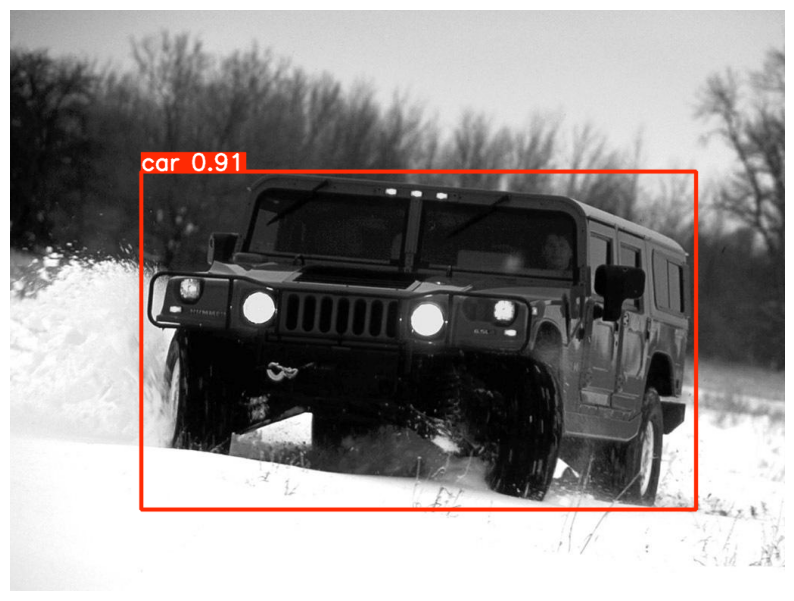

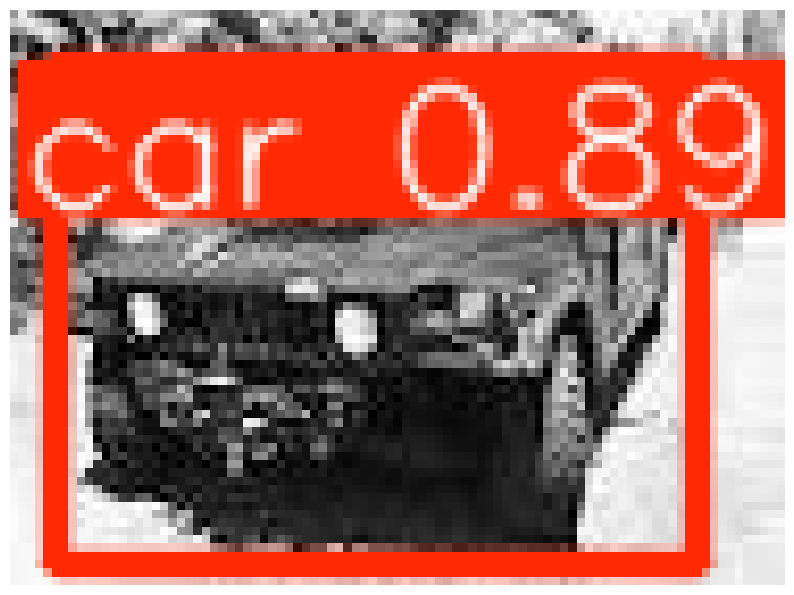

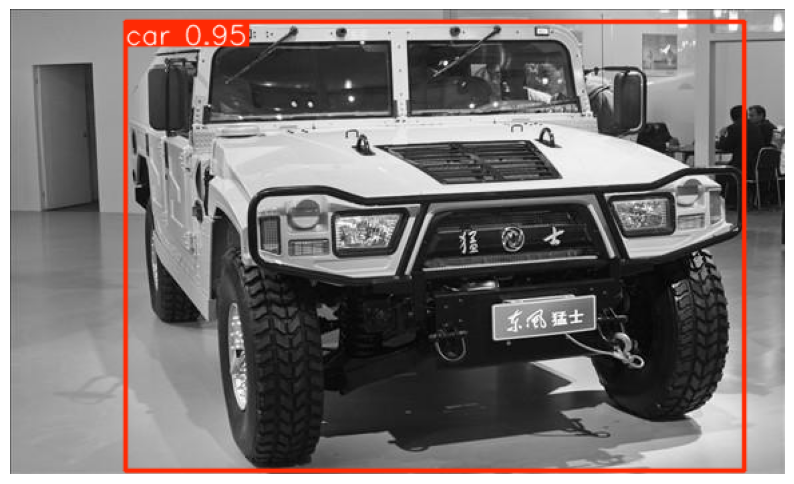

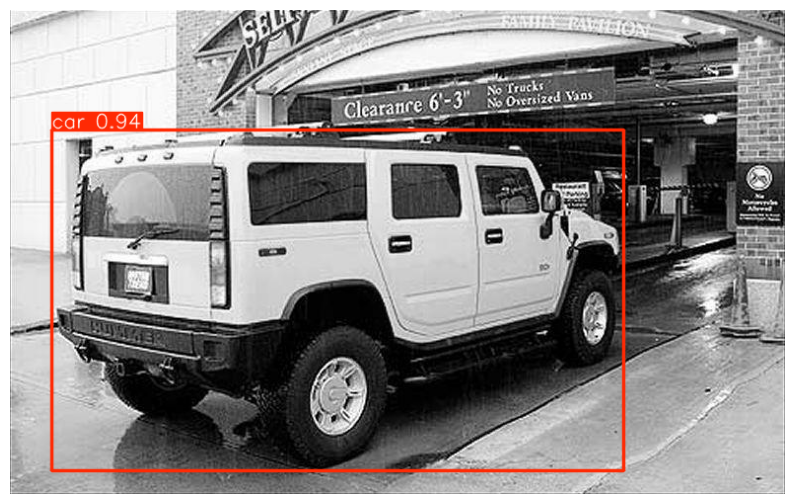

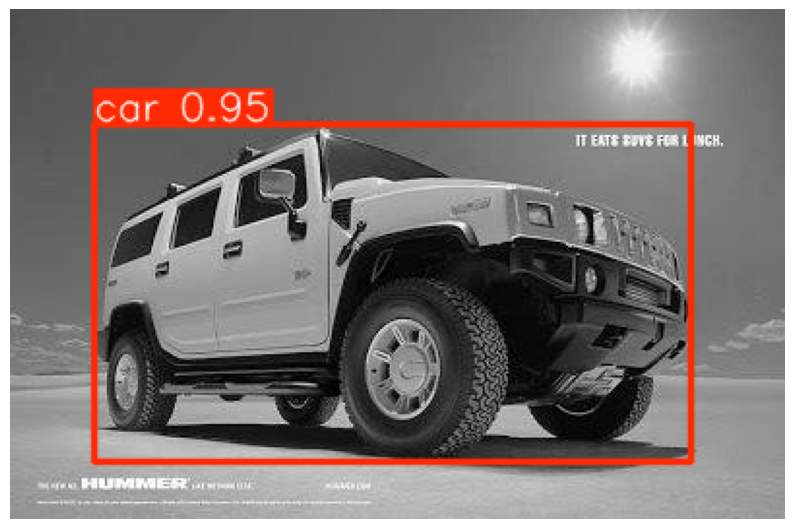

In [21]:
import time

# Mide velocidad pura
start = time.time()
results = model.predict(TEST_IMAGES_DIR, device=0, verbose=False)
end = time.time()

total_time = end - start
fps = len(results) / total_time

print(f"Velocidad de Inferencia: {fps:.2f} FPS")
print(f"Latencia por imagen: {(total_time/len(results))*1000:.2f} ms")

# Visualización de algunos resultados
for r in results[5:10]:  # Muestra las imágenes de la 6 a la 10
    plt.figure(figsize=(10, 10))
    plt.imshow(r.plot())
    plt.axis('off')
    plt.show()

In [22]:
# TÍTULO: Inferencia y Generación de Recortes (ROI)
# OBJETIVO: Validar el modelo de autos y generar los inputs para el detector de placas.

from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt
import glob
from tqdm.notebook import tqdm

# --- CONFIGURACIÓN ---
# MODEL_PATH = '../../production_weights/01_autos_best.pt' 

PROJECT_DIR = '../../models/01_autos'
run_name = f"08_v8m_resplit_dataset_tl"
model_yolov8n_baseline_tl = os.path.join(PROJECT_DIR, run_name, 'weights', 'best.pt')
model = YOLO(model_yolov8n_baseline_tl)


# Imágenes de prueba (pueden ser las del test set o nuevas descargadas de internet)
TEST_IMAGES_DIR = '../../datasets/01_autos/test/images'
OUTPUT_DIR = '../../data/processed/01_autos_recortes_test'

# Cargar Modelo
# model = YOLO(MODEL_PATH)


# Crear carpeta de salida
os.makedirs(OUTPUT_DIR, exist_ok=True)

def extract_crops(source_dir, output_dir):
    image_paths = glob.glob(os.path.join(source_dir, '*.jpg'))
    print(f"Procesando {len(image_paths)} imágenes...")
    
    count = 0
    for img_path in tqdm(image_paths):
        # Inferencia
        # conf=0.5: Solo autos con alta confianza
        results = model.predict(img_path, conf=0.5, verbose=False)
        
        original_img = cv2.imread(img_path)
        if original_img is None: continue
        
        for r in results:
            boxes = r.boxes
            for i, box in enumerate(boxes):
                # Coordenadas
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                
                # RECORTE (La magia del pipeline)
                # Validar límites para no romper cv2
                h, w, _ = original_img.shape
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w, x2), min(h, y2)
                
                crop = original_img[y1:y2, x1:x2]
                
                # Guardar recorte si tiene un tamaño decente
                if crop.size > 0 and crop.shape[0] > 10 and crop.shape[1] > 10:
                    base_name = os.path.splitext(os.path.basename(img_path))[0]
                    save_name = f"{base_name}_crop_{i}.jpg"
                    cv2.imwrite(os.path.join(output_dir, save_name), crop)
                    count += 1

    print(f"Se generaron {count} recortes de autos en '{output_dir}'")

# Ejecutar
extract_crops(TEST_IMAGES_DIR, OUTPUT_DIR)

Procesando 1615 imágenes...


  0%|          | 0/1615 [00:00<?, ?it/s]

Se generaron 1622 recortes de autos en '../../data/processed/01_autos_recortes_test'


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Velocidad de Inferencia: 131.51 FPS
Latencia por imagen: 7.60 ms


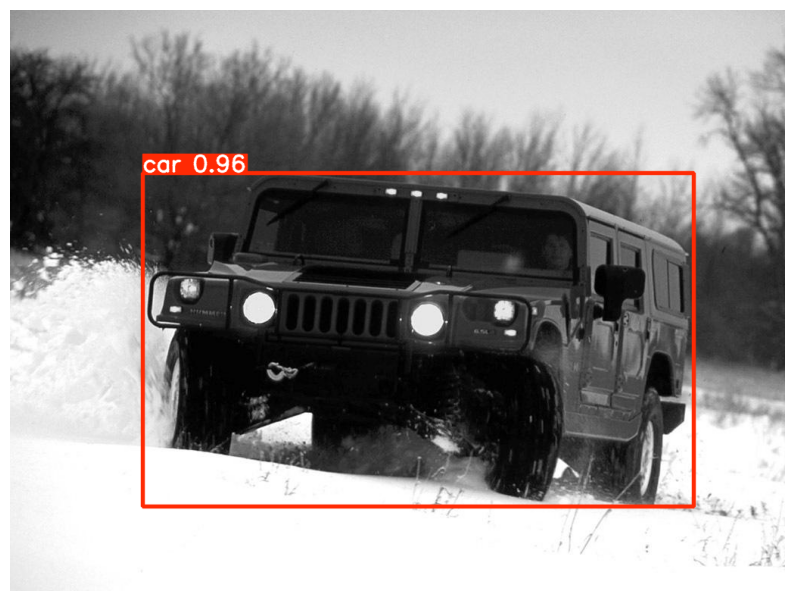

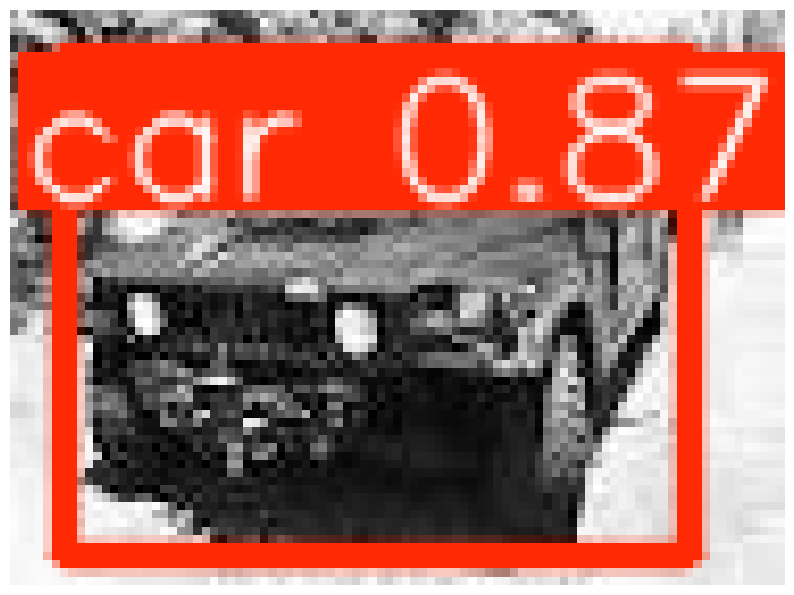

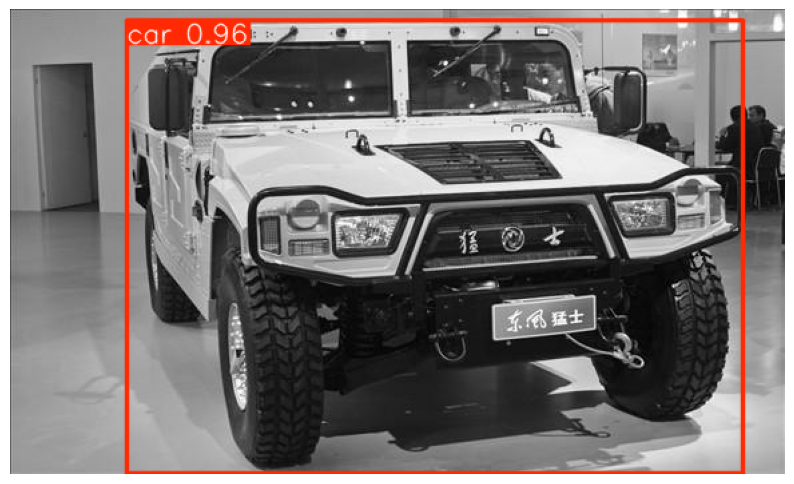

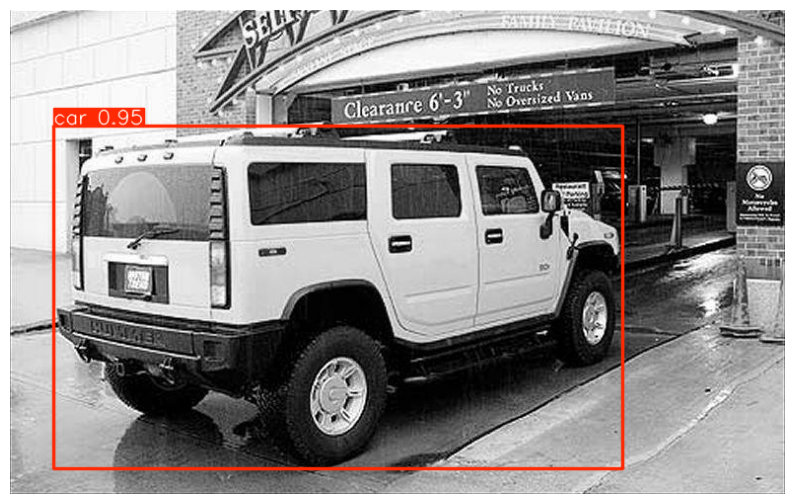

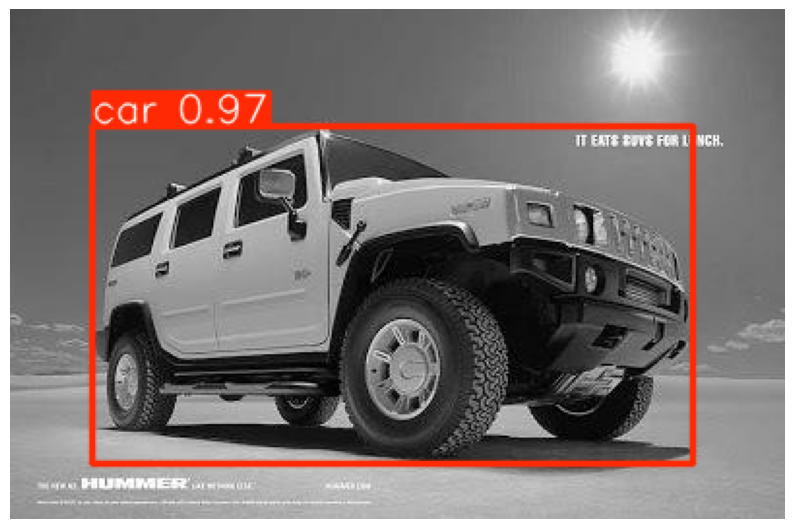

In [23]:
import time

# Mide velocidad pura
start = time.time()
results = model.predict(TEST_IMAGES_DIR, device=0, verbose=False)
end = time.time()

total_time = end - start
fps = len(results) / total_time

print(f"Velocidad de Inferencia: {fps:.2f} FPS")
print(f"Latencia por imagen: {(total_time/len(results))*1000:.2f} ms")

# Visualización de algunos resultados
for r in results[5:10]:  # Muestra las imágenes de la 6 a la 10
    plt.figure(figsize=(10, 10))
    plt.imshow(r.plot())
    plt.axis('off')
    plt.show()